In [2]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.cluster import hierarchy
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

In [3]:
df=pd.read_csv("/Users/ananthb/Downloads/USL/online_shoppers_intention.csv")

In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [12]:
df.isna().sum() #NO Null values

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

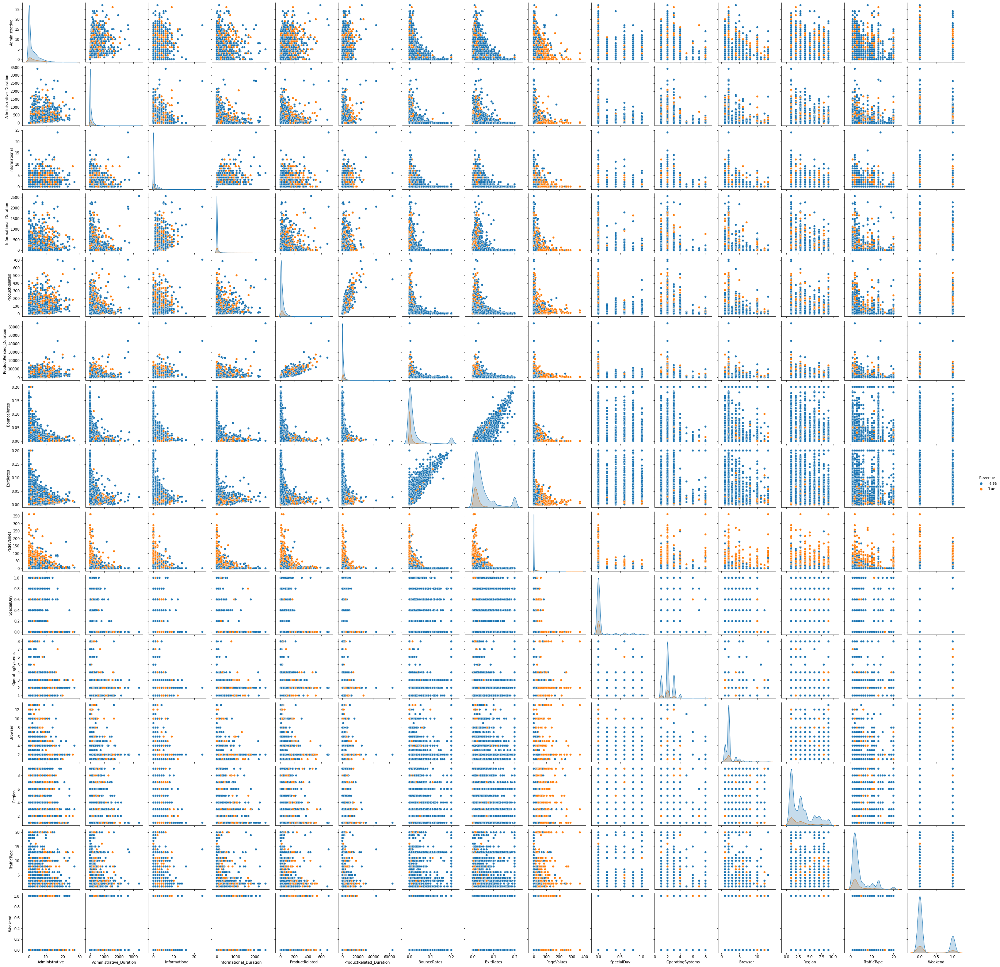

In [15]:
sns.pairplot(df,hue="Revenue")

In [6]:
sk=df.skew()

In [38]:
sk #Highly skewed

Administrative            -0.113407
Administrative_Duration   -0.051444
Informational              1.406615
Informational_Duration     1.574548
ProductRelated            -3.559698
ProductRelated_Duration   -3.010314
BounceRates               -0.161485
ExitRates                 -5.890655
PageValues                 1.366290
SpecialDay                 2.645329
OperatingSystems          -0.075426
Browser                    1.098796
Region                     0.230157
TrafficType                0.682455
Weekend                    1.265625
Revenue                    1.909180
dtype: float64

In [47]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType,Weekend,Revenue
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,0.573312,0.688124,0.222375,0.256092,1.189469,1.401101,0.428760,0.793655,0.262727,0.097722,1.043136,1.045441,1.056041,1.068880,0.232544,0.154785
std,0.538938,0.663266,0.427398,0.522694,0.113241,0.379123,0.389096,0.080161,0.494387,0.290977,0.026704,0.033707,0.051224,0.054440,0.422607,0.361816
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.129324,1.385388,0.000000,0.766799,0.000000,0.000000,1.044274,1.044274,1.000000,1.044274,0.000000,0.000000
50%,1.000000,1.134204,0.000000,0.000000,1.197994,1.491373,0.697138,0.794402,0.000000,0.000000,1.044274,1.044274,1.071075,1.044274,0.000000,0.000000
75%,1.090508,1.327715,0.000000,0.000000,1.255268,1.577064,0.774644,0.829250,0.000000,0.000000,1.071075,1.044274,1.090508,1.090508,0.000000,0.000000
max,1.228741,1.662293,1.219729,1.632684,1.506648,1.996986,0.904304,0.904304,1.445112,1.000000,1.138789,1.173874,1.147203,1.205909,1.000000,1.000000


In [7]:
for i in sk.index:
    df[i]=np.sqrt(df[i])  #After applying Transformation data is slightly  transformed

In [8]:
x=df.drop("Revenue",1)

In [9]:
cat=df.select_dtypes(include=object)

In [10]:
cl=pd.get_dummies(cat,drop_first=True)

In [11]:
num=df.select_dtypes(exclude=object)

In [12]:
dff=pd.concat([num,cl],axis=1)

In [13]:
ss=StandardScaler()
dfs=pd.DataFrame(ss.fit_transform(dff),columns=dff.columns) #Scaling Data

In [14]:
dfs.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Month_Feb,Month_Jul,Month_June,Month_Mar,Month_May,Month_Nov,Month_Oct,Month_Sep,VisitorType_Other,VisitorType_Returning_Visitor
0,-0.924143,-0.788772,-0.486499,-0.385377,-1.283990,-1.378753,3.002071,2.717242,-0.451878,-0.327024,...,8.124707,-0.190548,-0.154649,-0.427739,-0.612532,-0.566798,-0.215871,-0.194175,-0.083316,0.410621
1,-0.924143,-0.788772,-0.486499,-0.385377,-1.143856,-0.984547,-0.749333,1.367916,-0.451878,-0.327024,...,8.124707,-0.190548,-0.154649,-0.427739,-0.612532,-0.566798,-0.215871,-0.194175,-0.083316,0.410621
2,-0.924143,-0.788772,-0.486499,-0.385377,-1.283990,-1.378753,3.002071,2.717242,-0.451878,-0.327024,...,8.124707,-0.190548,-0.154649,-0.427739,-0.612532,-0.566798,-0.215871,-0.194175,-0.083316,0.410621
3,-0.924143,-0.788772,-0.486499,-0.385377,-1.143856,-1.298286,1.126369,1.964753,-0.451878,-0.327024,...,8.124707,-0.190548,-0.154649,-0.427739,-0.612532,-0.566798,-0.215871,-0.194175,-0.083316,0.410621
4,-0.924143,-0.788772,-0.486499,-0.385377,-0.552461,-0.144399,0.436965,0.413799,-0.451878,-0.327024,...,8.124707,-0.190548,-0.154649,-0.427739,-0.612532,-0.566798,-0.215871,-0.194175,-0.083316,0.410621


In [15]:

pc=PCA()
pc.fit_transform(dfs)

array([[-4.16827622, -2.0856632 , -2.25358565, ...,  0.13718892,
         0.05171294, -0.08096194],
       [-2.61504752, -0.36909288, -1.03902698, ..., -0.94087563,
         0.31874408, -0.05278877],
       [-4.2523296 , -1.35037046, -0.31167445, ...,  0.08849581,
         0.09572244, -0.08230487],
       ...,
       [-2.16145628, -0.20582081, -0.20233718, ...,  0.32188742,
        -0.15791791, -0.01449492],
       [ 0.22961323,  0.59361359, -0.08667516, ..., -0.27637285,
        -0.00889377, -0.03896117],
       [-1.48458977,  1.80430949, -0.62507979, ..., -0.72629529,
         0.35042487, -0.01938083]])

In [59]:
ev=pc.explained_variance_

In [73]:
ev/sum(ev)*100

array([13.75898692,  7.42953916,  6.39464018,  5.7901103 ,  5.36577762,
        4.78478905,  4.47116201,  4.36876745,  4.31367051,  3.91613943,
        3.86915636,  3.84011832,  3.803335  ,  3.64526914,  3.57129085,
        3.5247466 ,  3.13136116,  2.87789262,  2.34525172,  2.25322247,
        2.02211963,  1.8692135 ,  1.27403113,  0.94399744,  0.19808596,
        0.15740329,  0.07992219])

In [16]:
np.cumsum(pc.explained_variance_ratio_ *100)

array([ 15.54625652,  22.82609305,  29.18679759,  35.0638741 ,
        40.472485  ,  45.194328  ,  49.58334608,  53.84633278,
        57.97956473,  61.86622984,  65.73000235,  69.54858403,
        73.23891702,  76.79881509,  80.32849913,  83.75522371,
        86.85779014,  89.54001242,  92.1798315 ,  94.41293233,
        96.34002729,  97.70214082,  98.37465473,  98.97723539,
        99.50021427,  99.84152879, 100.        ])

In [17]:
pc=PCA(21)
dfp=pd.DataFrame(pc.fit_transform(dfs))
dfp.head()

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,-4.168276,-2.085663,-2.253586,0.346501,0.826532,1.707512,-0.201052,2.155523,0.923513,-3.654724,...,5.307119,2.394153,0.374237,-0.738255,-2.607115,0.006663,0.280927,-0.330829,0.254759,2.044970
1,-2.615048,-0.369093,-1.039027,-0.523064,0.070034,-0.229823,0.453625,1.914075,0.628947,-3.668360,...,5.561585,3.114869,0.121534,-0.235172,-1.832117,-0.624716,-0.912655,0.533533,0.893567,1.461186
2,-4.252330,-1.350370,-0.311674,1.817413,0.600942,1.232966,-0.036150,1.139338,1.467345,-3.015525,...,5.369099,2.433003,2.264175,-1.731426,-2.645370,-1.128708,0.168561,2.340022,-0.391566,2.154900
3,-3.441190,-0.832436,-0.451443,0.734668,0.464188,0.416398,0.245971,1.363063,0.939347,-3.567365,...,5.532499,2.756505,0.506699,-0.337986,-2.317734,-0.961289,-0.709612,1.129972,0.193485,1.801666
4,-1.994813,-0.385075,-0.303059,0.150369,0.398964,-0.781501,0.454558,1.120537,0.139968,-3.013554,...,5.721833,3.301055,1.388090,1.526697,-2.786219,-0.686021,-0.873291,0.390284,0.161411,1.863276


In [18]:
from sklearn.metrics import silhouette_score
err=[]
for i in range(2,10):
    kn=KMeans(i)
    ll=kn.fit_predict(dfp)
    err.append(kn.inertia_)
    print(i,silhouette_score(dfp,ll))

2 0.11040757682736375
3 0.09655348230249663
4 0.08952711995524554
5 0.11937661821573371
6 0.09008371826376546
7 0.1254237636497095
8 0.14096202494899238
9 0.14268454867500013


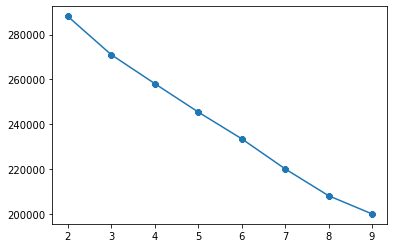

In [19]:
plt.plot(np.arange(2,10),err,marker="8")

In [20]:
from scipy.cluster.hierarchy import linkage,cophenet,dendrogram
from scipy.spatial.distance import pdist

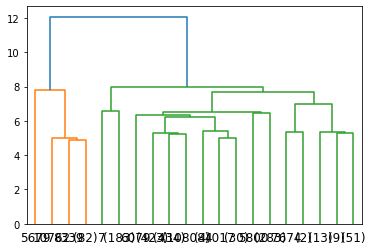

single 0.8108659169254355


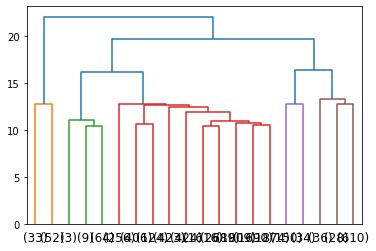

complete 0.6353570635968152


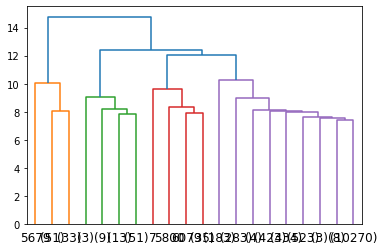

average 0.8813776877534981


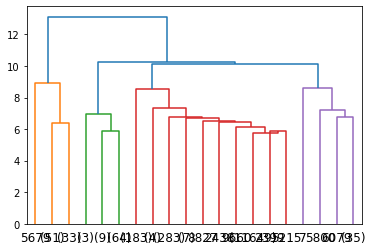

centroid 0.8654275792522825


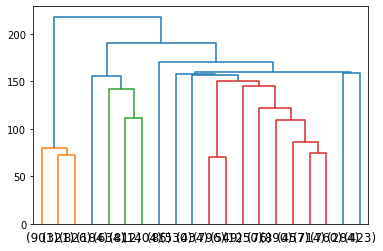

ward 0.35550940399855746


In [90]:
l=["single","complete","average","centroid","ward"]
for i in l:
    ld=linkage(dfp,method=i)
    v,y=cophenet(ld,pdist(dfp))
    dendrogram(ld,truncate_mode="lastp",p=20)
    plt.show()
    print(i,v)

In [29]:
x=dfp.drop("label",1)
y=dfp["label"]
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2)

In [30]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier()
rf.fit(xtrain,ytrain)
ypred=rf.predict(xtest)

In [24]:
from sklearn.metrics import classification_report

In [31]:
print(classification_report(ypred,ytest))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1348
           1       0.99      0.98      0.98      1118

    accuracy                           0.99      2466
   macro avg       0.99      0.98      0.99      2466
weighted avg       0.99      0.99      0.99      2466



In [33]:
kn=KMeans(9)
ll=kn.fit_predict(dfp)

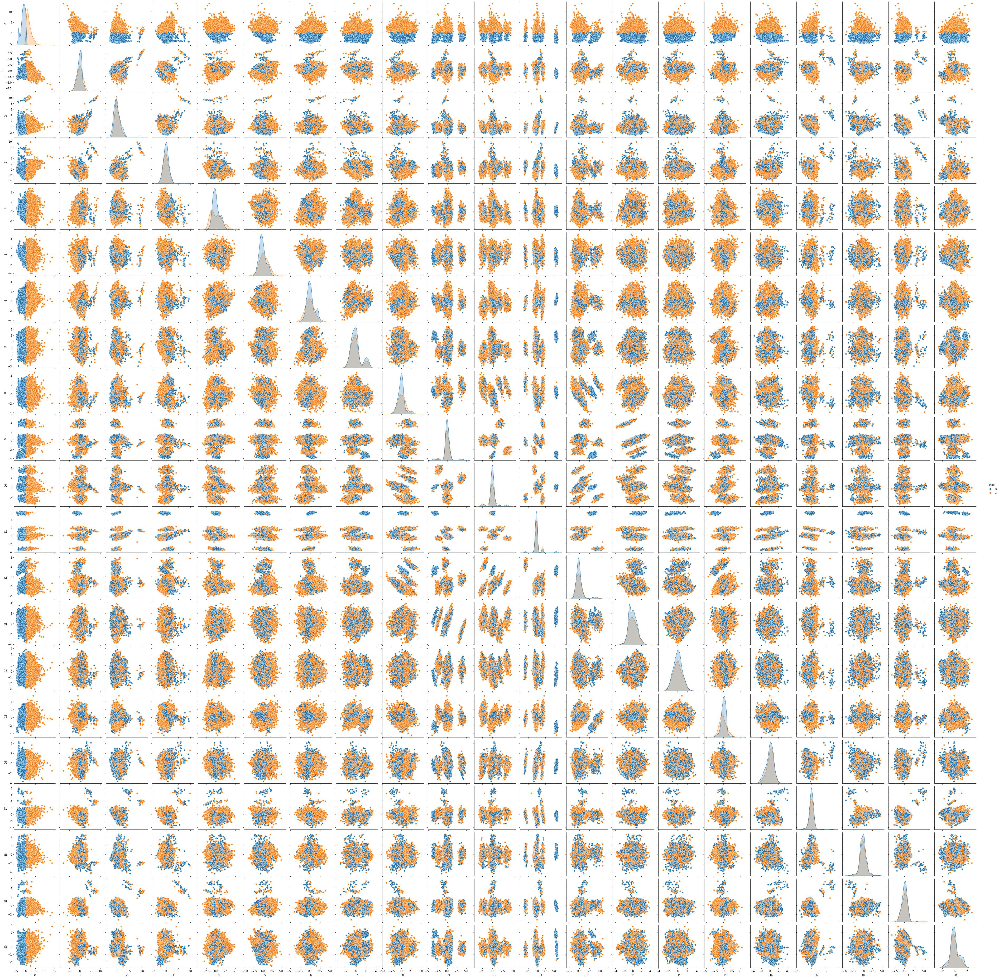

In [34]:
sns.pairplot(dfp,hue="label")

#Finally clustered the data points by two groups on similar characteristics